In [ ]:
# Upload the data in drive and mounting the drive woth colab.

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Go to the Drive Directory.
%cd drive/MyDrive

/content/drive/MyDrive


In [ ]:
# Go to the directory where you want to clone the repo and do the training.
# Make folder in google colab for that. Here, the current path is - "/content/drive/My Drive/OBJ_DET_yolov5s"
%cd OBJ_DET_yolov5s

/content/drive/My Drive/OBJ_DET_yolov5s


In [ ]:
# Clone the repository in Google Drive for later usage like hyper-parameter tuning, retraining the model with more data etc.
!git clone https://github.com/ultralytics/yolov5 

Cloning into 'yolov5'...
remote: Enumerating objects: 10187, done.
remote: Total 10187 (delta 0), reused 0 (delta 0), pack-reused 10187
Receiving objects: 100% (10187/10187), 10.42 MiB | 8.60 MiB/s, done.
Resolving deltas: 100% (7065/7065), done.


In [ ]:
# Go to the yolov5 directory in drive.
%cd yolov5

/content/drive/My Drive/OBJ_DET_yolov5s/yolov5


In [ ]:
# Install the requirements as per given in their requiremnets.txt
!pip install -r requirements.txt

     |████████████████████████████████| 596 kB 14.8 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
# Just for 50 epochs.

!python train.py --batch 4 --epochs 50 --data data/coco128.yaml --cfg models/yolov5s.yaml --name DLM

train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=data/coco128.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=50, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=DLM, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 2 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 2021-12-2 torch 1.10.0+cu111 CPU

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, h

In [18]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [21]:
# Testing the image with best weigh with confidence level 0.40.

!python detect.py --weights runs/train/DLM/weights/best.pt --conf 0.4 --source /content/drive/MyDrive/obj_classification/vehicle_test

detect: weights=['runs/train/DLM/weights/best.pt'], source=/content/drive/MyDrive/obj_classification/vehicle_test, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 2021-12-2 torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/12 /content/drive/MyDrive/obj_classification/vehicle_test/1259.jpg: 384x640 1 car, Done. (0.303s)
image 2/12 /content/drive/MyDrive/obj_classification/vehicle_test/1263.jpg: 384x640 Done. (0.298s)
image 3/12 /content/drive/MyDrive/obj_classification/vehicle_test/1264.jpg: 384x640 2 bikes, Done. (0.288s)
image 4/12 /content/drive/MyDrive/obj_classification/vehicle_test/1265.jpg: 384x640

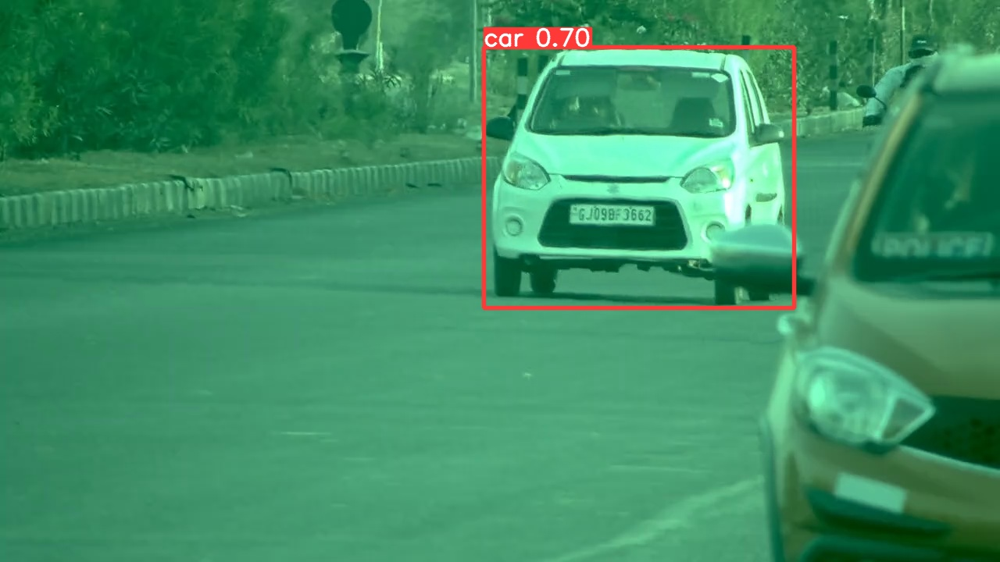

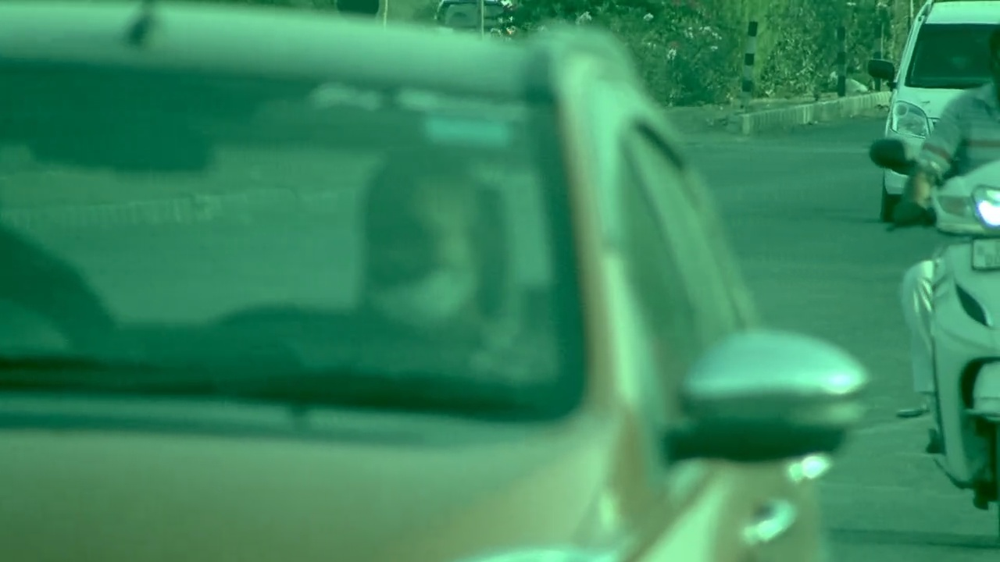

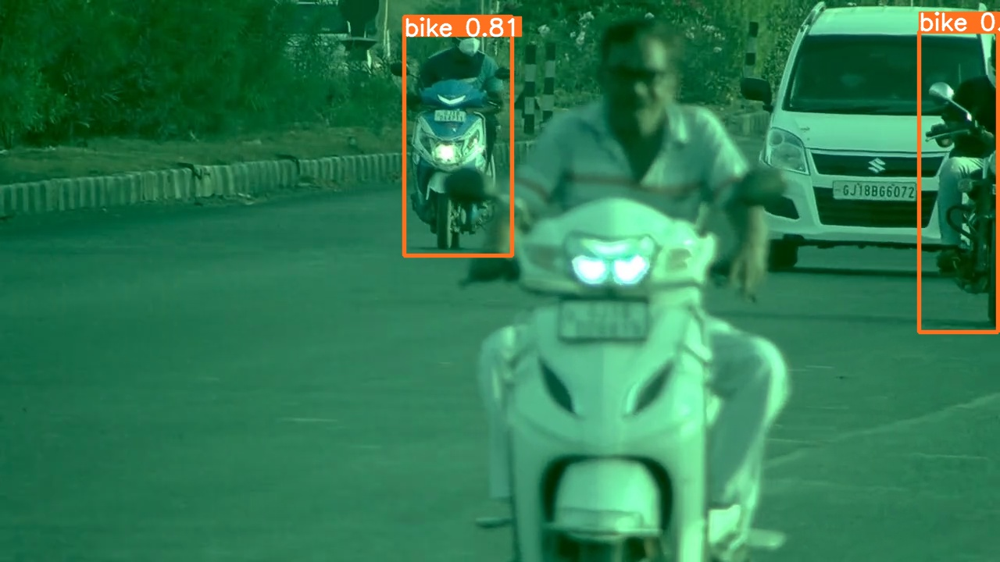

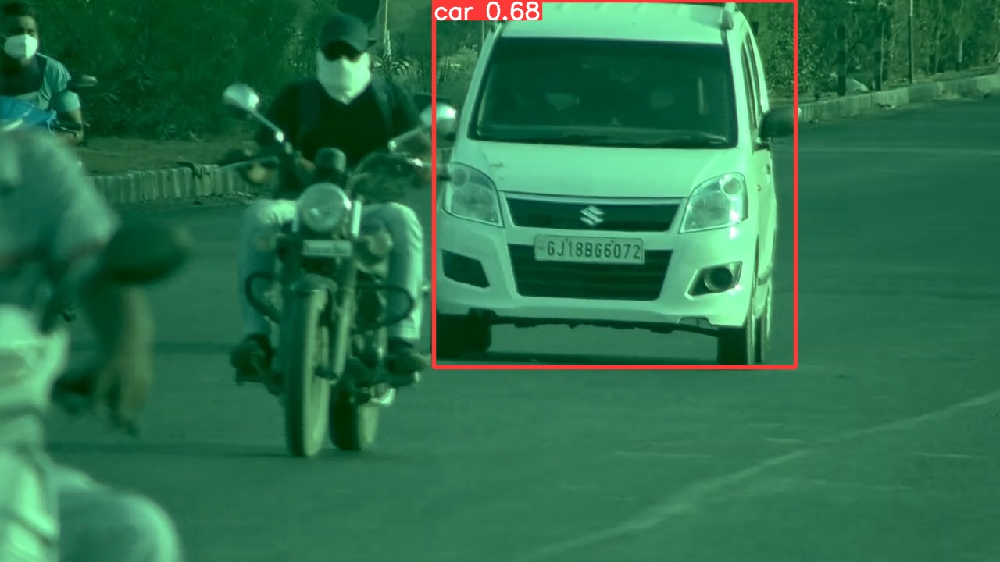

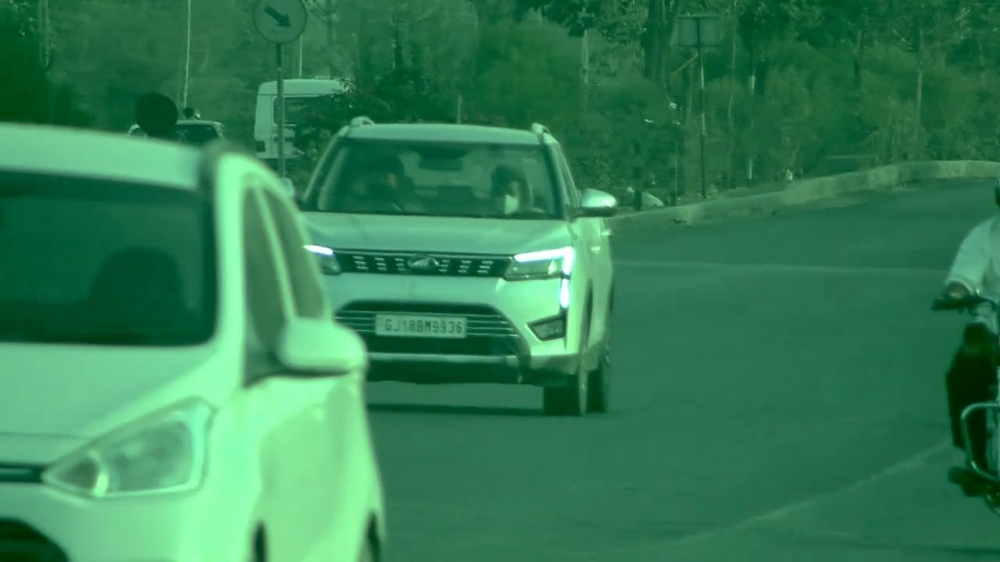

...

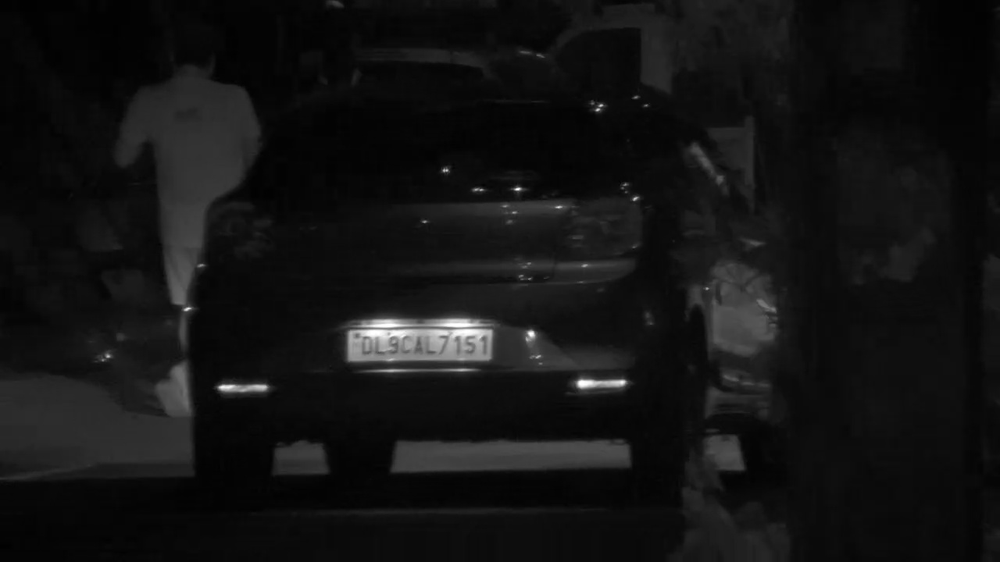

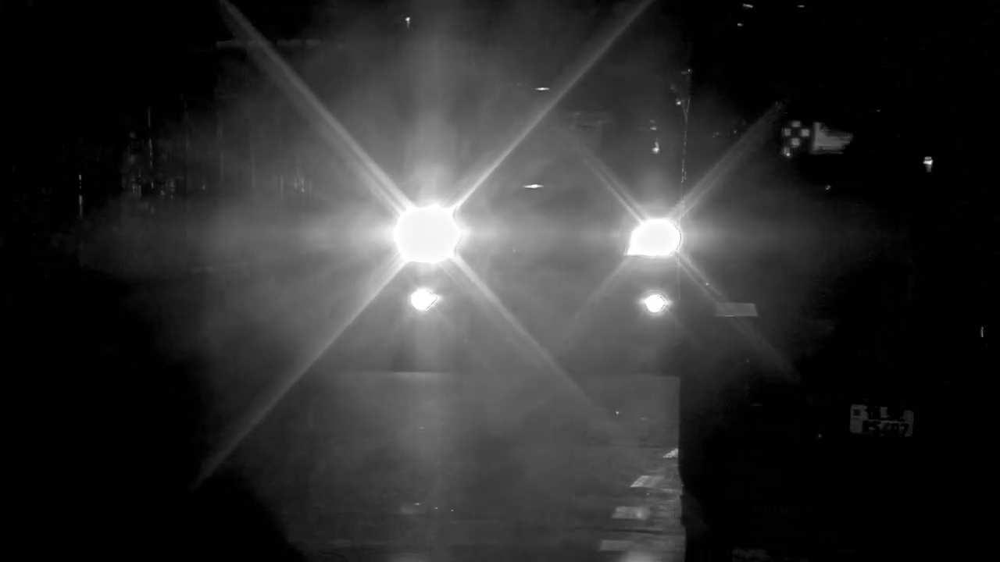

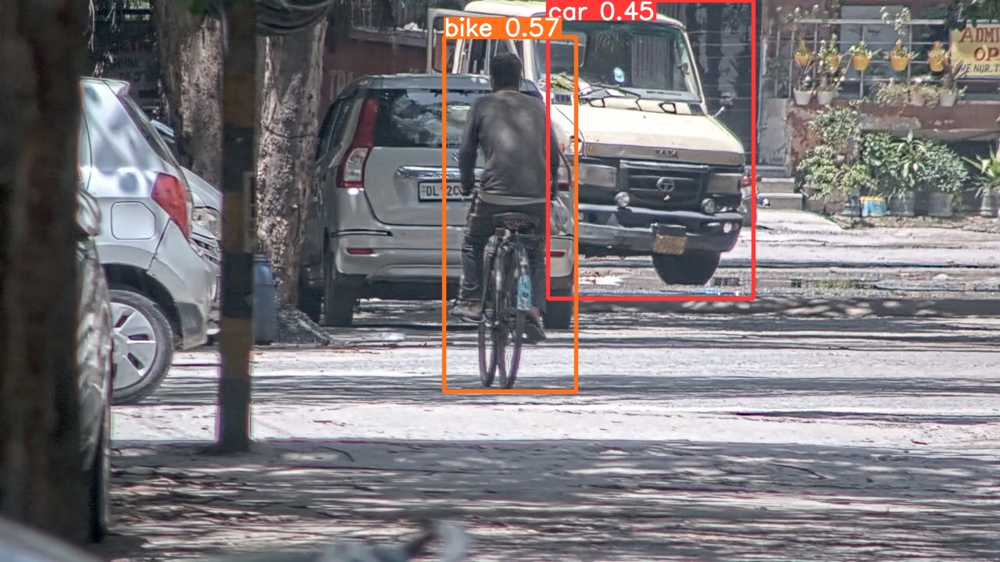

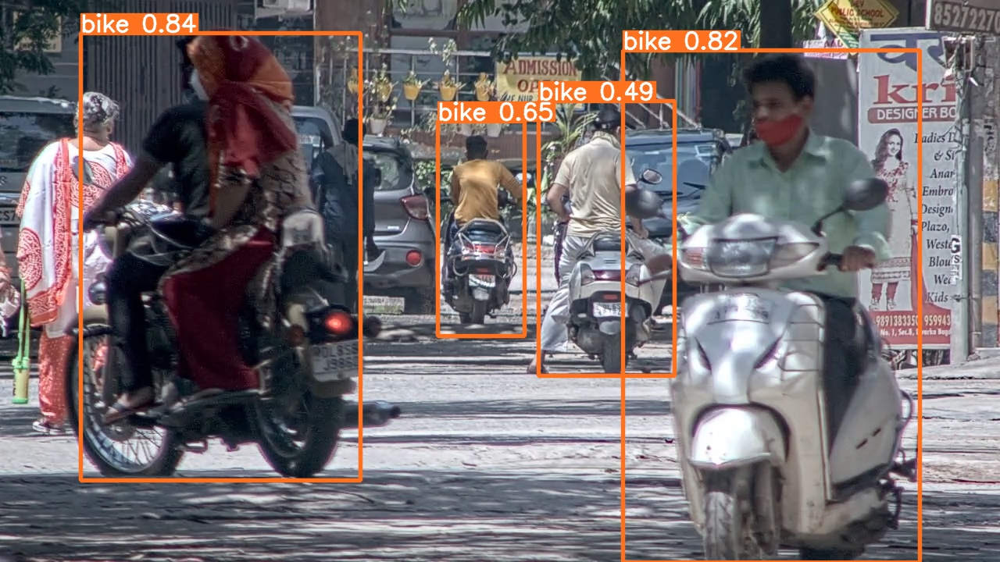

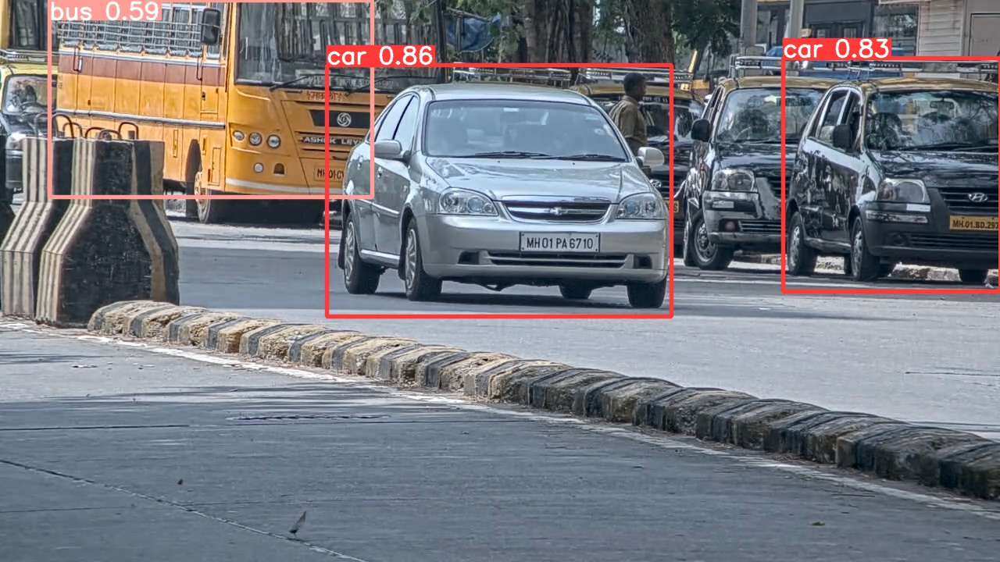

In [22]:
# All images from test dataset.

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/OBJ_DET_yolov5s/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
# We will look into many things like augmentation, hyperparamter tuning, retraining, resume training etc.